In [1]:
import numpy as np
import pandas as pd
import time
import re
import torch
import matplotlib.pyplot as plt
import seaborn as sns 

import torch.nn as nn
import torch.nn.functional as F
import torch.autograd as autograd

from sklearn.datasets import load_iris

import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import FashionMNIST

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


#### Loss function

In [ ]:
nll_loss = torch.nn.BCELoss()

soft = torch.nn.Softmax(dim=1)
sig = torch.nn.Sigmoid()
input=torch.rand((4, 10))

In [ ]:
target_a = torch.LongTensor([0, 4, 1, 8])
y_onehot_a = torch.FloatTensor(target_a.size(0), 10)
y_onehot_a.zero_()
y_onehot_a.scatter_(1, target_a.unsqueeze(1).data.cpu(), 1)
y_onehot_a

tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.]])

In [ ]:
target_b = torch.LongTensor([5, 6, 8, 3])
y_onehot_b = torch.FloatTensor(target_b.size(0), 10)
y_onehot_b.zero_()
y_onehot_b.scatter_(1, target_b.unsqueeze(1).data.cpu(), 1)
y_onehot_b

tensor([[0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 1., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.]])

In [ ]:
y_onehot_soft = 0.5*y_onehot_a + 0.5*y_onehot_b
y_onehot_soft

tensor([[0.5000, 0.0000, 0.0000, 0.0000, 0.0000, 0.5000, 0.0000, 0.0000, 0.0000,
         0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.5000, 0.0000, 0.5000, 0.0000, 0.0000,
         0.0000],
        [0.0000, 0.5000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.5000,
         0.0000],
        [0.0000, 0.0000, 0.0000, 0.5000, 0.0000, 0.0000, 0.0000, 0.0000, 0.5000,
         0.0000]])

In [ ]:
y_onehot_sig = y_onehot_a + y_onehot_b
y_onehot_sig

tensor([[1., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1., 0., 1., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 1., 0.]])

In [ ]:
print(soft(input))
loss = nll_loss(soft(input), y_onehot_soft)
loss.item()

tensor([[0.1141, 0.0629, 0.1245, 0.0647, 0.0987, 0.1112, 0.0810, 0.1184, 0.1224,
         0.1021],
        [0.0774, 0.0624, 0.1235, 0.1434, 0.1193, 0.0605, 0.0565, 0.1457, 0.0929,
         0.1183],
        [0.1034, 0.0835, 0.1592, 0.1019, 0.0719, 0.1354, 0.0672, 0.0835, 0.0783,
         0.1156],
        [0.0827, 0.1273, 0.0634, 0.0692, 0.1000, 0.1309, 0.1165, 0.1414, 0.0937,
         0.0748]])


0.3392246663570404

In [ ]:
print(sig(input))
loss = nll_loss(sig(input), y_onehot_sig)
loss.item()

tensor([[0.7113, 0.5762, 0.7290, 0.5828, 0.6808, 0.7061, 0.6363, 0.7189, 0.7256,
         0.6881],
        [0.5786, 0.5253, 0.6866, 0.7177, 0.6791, 0.5175, 0.5007, 0.7210, 0.6222,
         0.6773],
        [0.6140, 0.5621, 0.7100, 0.6106, 0.5251, 0.6756, 0.5084, 0.5623, 0.5465,
         0.6401],
        [0.6041, 0.7014, 0.5392, 0.5607, 0.6485, 0.7072, 0.6825, 0.7228, 0.6335,
         0.5799]])


0.9272339940071106

### Gradient Calculation

In [ ]:
a = torch.Tensor([2.0])
b = torch.Tensor([3.0])
c = torch.Tensor([4.0])

y = torch.Tensor([9.0])

loss_fn = nn.L1Loss()

w1 = nn.Linear(1, 1, bias=False)
w2 = nn.Linear(1, 1, bias=False)
w3 = nn.Linear(1, 1, bias=False)

w1.weight.data.fill_(0.5)
w2.weight.data.fill_(0.5)
w3.weight.data.fill_(0.5)

w = nn.Linear(1, 1, bias=False)
w.weight.data.fill_(1.0)

tensor([[1.]])

In [ ]:
z1 = w1(a)
z2 = w2(b)
z3 = w3(c)

z1.retain_grad()
z2.retain_grad()

z = (z1+z2)/2
z.retain_grad()
y_p = w(z)

y_p.retain_grad()

In [ ]:
loss = loss_fn(y_p, y)
loss.backward(retain_graph=True)

In [ ]:
loss.item()

7.75

In [ ]:
z1, z2, z3

(tensor([1.], grad_fn=<SqueezeBackward3>),
 tensor([1.5000], grad_fn=<SqueezeBackward3>),
 tensor([2.], grad_fn=<SqueezeBackward3>))

In [ ]:
for n, p in w1.named_parameters():
  print('Name :',n)
  print('Grad : ', p.grad)

Name : weight
Grad :  tensor([[-1.]])


In [ ]:
for n, p in w3.named_parameters():
  print('Name :',n)
  print('Grad : ', p.grad)

Name : weight
Grad :  None


In [ ]:
def hook_fn(grad):
  return z1.grad

z3.register_hook(hook_fn)
z3.backward(torch.Tensor([1.0]))

In [ ]:
for n, p in w3.named_parameters():
  print('Name :',n)
  print('Grad : ', p.grad)

Name : weight
Grad :  tensor([[-2.]])


In [ ]:
for n, p in w.named_parameters():
  print('Name :',n)
  print('Grad : ', p.grad)

Name : weight
Grad :  tensor([[-1.2500]])


In [ ]:
for n, p in w2.named_parameters():
  print('Name :',n)
  print('Grad : ', p.grad)

Name : weight
Grad :  tensor([[-1.5000]])


Implement single chunk 2 centrally and pass the hidden states of each worker by averaging them.

### Assert unicasting and broadcasting

Experiment to assert whether back propagation is working properly.

Setting A:
1. Devise 2 client workers (MLP).
2. Mix their outputs in variable proportion (0.6,0.4).
3. Feed the mixed vector into server worker.
4. Calculate Loss and backprop.
5. Print the gradients.

Setting B:
1. Devise 2 client workers (MLP).
2. Mix their detached outputs in variable proportion (0.6, 0.4).
3. Feed the mixed vector and pass into server worker.
4. Calculate loss and backprop (server grads calculated).
5. Using Grads calculated for clients outputs, calculate grads for clients.
6. Print the gradients.

Both the gradients should be the same.

In [ ]:
X, Y=load_iris(return_X_y=True)
print(X.shape, Y.shape)
x1 = torch.Tensor(X[0])
x2 = torch.Tensor(X[1])
y1 = torch.Tensor([Y[0]])
y2 = torch.Tensor([Y[1]])
print(x1.size(), y1.size())
print('sample x\'s = ', x1, x2)
print('sample y\'s = ', y1, y2)

(150, 4) (150,)
torch.Size([4]) torch.Size([1])
sample x's =  tensor([5.1000, 3.5000, 1.4000, 0.2000]) tensor([4.9000, 3.0000, 1.4000, 0.2000])
sample y's =  tensor([0.]) tensor([0.])


In [ ]:
loss_fn=nn.MSELoss()

Setting A

In [ ]:
A_client1 = nn.Linear(4, 2, bias=False)    # Client 1 
A_client2 = nn.Linear(4, 2, bias=False)    # Client 2
A_server = nn.Linear(2, 1, bias=False)     # Server

A_client1.weight.data.fill_(0.1)           # Fixing weights for client1
A_client2.weight.data.fill_(0.1)           # Fixing weights for client2
A_server.weight.data.fill_(0.1)            # Fixing weights for server

tensor([[0.1000, 0.1000]])

In [ ]:
z1 = Aw1(x1)                               # Client 1 output
z2 = Aw2(x2)
z = 0.6*z1 + 0.4*z2
yt = 0.6*y1 + 0.4*y2
yp = Aw(z)
loss = loss_fn(yp, yt)
loss.backward()

In [ ]:
print('\nCentral Server')
for n,p in Aw.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 1')
for n,p in Aw1.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 2')
for n,p in Aw2.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)


Central Server
Name =  weight
Grads :
 tensor([[0.3936, 0.3936]])

Client 1
Name =  weight
Grads :
 tensor([[0.1214, 0.0833, 0.0333, 0.0048],
        [0.1214, 0.0833, 0.0333, 0.0048]])

Client 2
Name =  weight
Grads :
 tensor([[0.0778, 0.0476, 0.0222, 0.0032],
        [0.0778, 0.0476, 0.0222, 0.0032]])


In [ ]:
# Initialise clients and servers

A_client1 = nn.Linear(4, 2, bias=False)    # Client 1 
A_client2 = nn.Linear(4, 2, bias=False)    # Client 2
A_server = nn.Linear(2, 1, bias=False)     # Server

# Fix initial weights for cross-checking
A_client1.weight.data.fill_(0.1)           # Fixing weights for client1
A_client2.weight.data.fill_(0.1)           # Fixing weights for client2
A_server.weight.data.fill_(0.1)            # Fixing weights for server

# Pass inputs through clients
z1 = A_client1(x1)                         # Client 1 output
z2 = A_client2(x2)                         # Client 2 output      

# Calculate server input
z = 0.6*z1 + 0.4*z2                        # Mix clients outputs to get server input
# Calculate target mixup
yt = 0.6*y1 + 0.4*y2                       # Mix target labels

# Pass mixed input through server
yp = A_server(z)                           # Server output

# Loss and Gradient Calculation
loss = loss_fn(yp, yt)                     # Calculate loss at server side
loss.backward()                            # Calculate gradients

# Gradient Values
print('\nCentral Server')
for n,p in A_server.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 1')
for n,p in A_client1.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 2')
for n,p in A_client2.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)


Central Server
Name =  weight
Grads :
 tensor([[0.3936, 0.3936]])

Client 1
Name =  weight
Grads :
 tensor([[0.1214, 0.0833, 0.0333, 0.0048],
        [0.1214, 0.0833, 0.0333, 0.0048]])

Client 2
Name =  weight
Grads :
 tensor([[0.0778, 0.0476, 0.0222, 0.0032],
        [0.0778, 0.0476, 0.0222, 0.0032]])


Setting B

In [ ]:
B_client1 = nn.Linear(4, 2, bias=False)    # Client 1
B_client2 = nn.Linear(4, 2, bias=False)    # Client 2
B_server = nn.Linear(2, 1, bias=False)     # Server

B_client1.weight.data.fill_(0.1)           # Fix weights for client 1
B_client2.weight.data.fill_(0.1)           # Fix weights for client 2
B_server.weight.data.fill_(0.1)            # Fix weights for server

tensor([[0.1000, 0.1000]])

In [ ]:
z1 = Bw1(x1)
z2 = Bw2(x2)
z1.retain_grad
z2.retain_grad
z = 0.6*z1.detach() + 0.4*z2.detach()
z.requires_grad = True
z.retain_grad
yt = 0.6*y1 + 0.4*y2
yp = Bw(z)
loss = loss_fn(yp, yt)
loss.backward()

In [ ]:
print('\nCentral Server')
for n,p in Bw.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)


Central Server
Name =  weight
Grads :
 tensor([[0.3936, 0.3936]])


In [ ]:
print(z.grad)

tensor([0.0397, 0.0397])


In [ ]:
z1.backward(0.6*z.grad)

In [ ]:
for n,p in Bw1.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)

Name =  weight
Grads :
 tensor([[0.1214, 0.0833, 0.0333, 0.0048],
        [0.1214, 0.0833, 0.0333, 0.0048]])


In [ ]:
z2.backward(0.4*z.grad)

In [ ]:
for n,p in Bw2.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)

Name =  weight
Grads :
 tensor([[0.0778, 0.0476, 0.0222, 0.0032],
        [0.0778, 0.0476, 0.0222, 0.0032]])


In [ ]:
B_client1 = nn.Linear(4, 2, bias=False)    # Client 1
B_client2 = nn.Linear(4, 2, bias=False)    # Client 2
B_server = nn.Linear(2, 1, bias=False)     # Server

B_client1.weight.data.fill_(0.1)           # Fix weights for client 1
B_client2.weight.data.fill_(0.1)           # Fix weights for client 2
B_server.weight.data.fill_(0.1)            # Fix weights for server

# Calculate outputs of clients Locally
z1 = B_client1(x1)                         # Client 1 output
z2 = B_client2(x2)                         # Client 2 output
#z1.retain_grad
#z2.retain_grad

# Send z1 and z2 from clients to server -> 1st communication step
# Calculate mixed output at server side
z = 0.6*z1.detach() + 0.4*z2.detach()      # .detach to ensure backprop at server side doesn't affect client side
z.requires_grad = True                     # Make sure mixed server input's tensor's gradients are calculated
z.retain_grad                              # To obtain gradients of mixed server input later on

# Calculate Target mixup
yt = 0.6*y1 + 0.4*y2                       # Mixed targets

# Calculate output at server side          
yp = B_server(z)                           # Pass mixed server input through server model

# Loss and Gradient Calculation
loss = loss_fn(yp, yt)                 
loss.backward()

# Assert Gradient values
print('\nCentral Server')
for n,p in B_server.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 1 Grads (Gradients haven\'t been back communicated yet):')
for n,p in B_client1.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 2 Grads (Gradients haven\'t been back communicated yet):')
for n,p in B_client2.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)

# Send the z tensor (containing its gradient values now) from server to clients -> 2nd Round of Communication

# Calculate gradient at Client 1 locally using values of z
z1.backward(0.6*z.grad)
# Calculate gradient at Client 2 locally using values of z
z2.backward(0.4*z.grad)

# Assert Gradient values
print('\nCentral Server')
for n,p in B_server.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 1 Grads :')
for n,p in B_client1.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)
print('\nClient 2 Grads :')
for n,p in B_client2.named_parameters():
  print('Name = ', n)
  print('Grads :\n', p.grad)


Central Server
Name =  weight
Grads :
 tensor([[0.3936, 0.3936]])

Client 1 Grads (Gradients haven't been back communicated yet):
Name =  weight
Grads :
 None

Client 2 Grads (Gradients haven't been back communicated yet):
Name =  weight
Grads :
 None

Central Server
Name =  weight
Grads :
 tensor([[0.3936, 0.3936]])

Client 1 Grads :
Name =  weight
Grads :
 tensor([[0.1214, 0.0833, 0.0333, 0.0048],
        [0.1214, 0.0833, 0.0333, 0.0048]])

Client 2 Grads :
Name =  weight
Grads :
 tensor([[0.0778, 0.0476, 0.0222, 0.0032],
        [0.0778, 0.0476, 0.0222, 0.0032]])


#### Conv Example

In [ ]:
class Chunk1(nn.Module):
  def __init__(self, c_out):
    super(Chunk1, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3)
    self.act = nn.ReLU()
    self.bn1 = nn.BatchNorm2d(num_features=64)
    self.conv2 = nn.Conv2d(in_channels=64, out_channels=c_out, kernel_size=3)
    
  def forward(self, x):
    x = self.bn1(self.act(self.conv1(x)))
    x = self.act(self.conv2(x))
    return x

class Chunk2(nn.Module):
  def __init__(self, c_in):
    super(Chunk2, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=c_in, out_channels=64, kernel_size=3)
    self.act = nn.ReLU()
    self.bn1 = nn.BatchNorm2d(num_features=64)
    self.avgpool = nn.AvgPool2d(kernel_size=4, stride=2)
    self.head = nn.Linear(in_features=9216, out_features=10)
    self.softmax = nn.Softmax(dim=-1)

  def forward(self, x):
    x = self.bn1(self.act(self.conv1(x)))
    x = self.avgpool(x)
    x = x.view(x.size(0), -1)
    x = self.softmax(self.head(x))
    return x

In [ ]:
w1_c1 = Chunk1(128)
w2_c1 = Chunk1(128)
w3_c1 = Chunk1(128)

c2 = Chunk2(128)

loss_fn = torch.nn.CrossEntropyLoss()

In [ ]:
input=torch.rand((16, 3, 32, 32), requires_grad=False)
x1 = w1_c1(input)
x2 = w2_c1(input)
x3 = w3_c1(input)

In [ ]:
x1.retain_grad()
x2.retain_grad()
x = (x1+x2)/2
x.retain_grad()

In [ ]:
y_pred = c2(x)
y_true = torch.empty(16, dtype=torch.long).random_(5)

In [ ]:
loss = loss_fn(y_pred, y_true)

In [ ]:
loss.backward(retain_graph=True)

Grads :


1.   conv.weight = (out_c, in_c, ksize, ksize)

2.   conv.bias = (out_c)

3.   bn = (in_f)


In [ ]:
for n,p in w1_c1.named_parameters():
  print('Name : ', n)
  print('Grads : ', p.grad.size())

Name :  conv1.weight
Grads :  torch.Size([64, 3, 3, 3])
Name :  conv1.bias
Grads :  torch.Size([64])
Name :  bn1.weight
Grads :  torch.Size([64])
Name :  bn1.bias
Grads :  torch.Size([64])
Name :  conv2.weight
Grads :  torch.Size([128, 64, 3, 3])
Name :  conv2.bias
Grads :  torch.Size([128])


In [ ]:
for n,p in c2.named_parameters():
  print('Name : ', n)
  print('Grads : ', p.grad.size())

Name :  conv1.weight
Grads :  torch.Size([64, 128, 3, 3])
Name :  conv1.bias
Grads :  torch.Size([64])
Name :  bn1.weight
Grads :  torch.Size([64])
Name :  bn1.bias
Grads :  torch.Size([64])
Name :  head.weight
Grads :  torch.Size([10, 9216])
Name :  head.bias
Grads :  torch.Size([10])


In [ ]:
x1.grad

Average Case

In [ ]:
def hook_fn(grad):
  return x1.grad

x3.register_hook(hook_fn)

In [ ]:
x3.backward(torch.ones((16, 128, 28, 28)))

In [ ]:
for n,p in w3_c1.named_parameters():
  print('Name : ', n)
  print('Grads : ', p.grad)

In [ ]:
for n,p in w1_c1.named_parameters():
  print('Name : ', n)
  print('Grads : ', p.grad)

In [ ]:
for n,p in w3_c1.named_parameters():
  print('Name : ', n)
  print('Grads : ', p.grad)

In [ ]:
def straggler(module, grad_input, grad_output):
  grad_output = autograd.grad(outputs=grad_input, inputs=module.data)
  return grad_output

In [ ]:
for n, p in w3_c1.named_parameters():
  if p.grad is not None:
    p.register_hook(straggler)

In [ ]:
for n,p in w3_c1.named_parameters():
  print('Name : ', n)
  print('Grads : ', p.grad)

### Central Chunk 2

In [3]:
cd /content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10

/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10


#### FMNIST Baseline (E2E Training)

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_3.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 1  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --alpha_1 0.0 --beta_1 0.0 --beta_2 1.0 --gamma_1 0.0 --gamma_2 0.0 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 150 --run 1

Storing in ... ./Mixup_fmnist_resnet16_K_1_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_1.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
W1 Epoch: [0][1/2]	Time 0.256 (0.256)	Loss 2.4193 (2.4193)	Prec@1 11.719 (11.719)	
W2 Epoch: [0][1/2]	Time 0.256 (0.256)	Loss 2.5052 (2.5052)	Prec@1 11.719 (11.719)	
W3 

#### FMNIST v1.0

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 150 --pooling_mode 'average' --run 1

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.271 (0.271)	Loss 0.3423 (0.3423)	
Train Epoch: [0][2/2]	Time 0.218 (0.244)	Loss 0.3453 (0.3438)	
W1 Val: [0][10/10]	Time 0.352 (0.352)	Loss 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.211 (0.211)	Loss 0.3457 (0.3457)	
Train Epoch: [0][2/2]	Time 0.169 (0.190)	Loss 0.3447 (0.3452)	
W1 Val: [0][10/10]	Time 0.328 (0.302)	Loss 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'chlr_wd_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_chlr_wd_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.212 (0.212)	Loss 0.3487 (0.3487)	
Train Epoch: [0][2/2]	Time 0.176 (0.194)	Loss 0.3440 (0.3464)	
W1 Val: [0][10/10]	Time 0.324 (

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'chlr_wd_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_chlr_wd_exp
26422272it [00:02, 11577820.96it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 204279.73it/s]              
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 3785063.43it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 23883043.35it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly n

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 1 --extra 'chlr_wd_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_chlr_wd_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.292 (0.292)	Loss 0.3345 (0.3345)	
Train Epoch: [0][2/2]	Time 0.232 (0.262)	Loss 0.3339 (0.3342)	
W1 Val: [0][10/10]	Time 0.376 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 2 --extra 'chlr_wd_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_chlr_wd_exp
26422272it [00:02, 11309101.36it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 214404.58it/s]               
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 4010845.47it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 23685481.41it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 200 --pooling_mode 'average' --run 1 --extra 'chlr_wd'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_chlr_wd
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.210 (0.210)	Loss 0.3397 (0.3397)	
Train Epoch: [0][2/2]	Time 0.188 (0.199)	Loss 0.3324 (0.3362)	
W1 Val: [0][10/10]	Time 0.334 (0.30

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 2 --extra 'chlr_wd_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_wd_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.250 (0.250)	Loss 0.3396 (0.3396)	
Train Epoch: [0][2/2]	Time 0.195 (0.222)	Loss 0.3358 (0.3377)	
W1 Val: [0][10/10]	Time 0.357 (

#### FMNIST v1.1
Changing Lr at 150 epochs instead of 120

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'chlr_2_wd'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_chlr_2_wd
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.246 (0.246)	Loss 0.3569 (0.3569)	
Train Epoch: [0][2/2]	Time 0.202 (0.224)	Loss 0.3474 (0.3523)	
W1 Val: [0][10/10]	Time 0.353 (0.

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 2 --extra 'chlr_2_wd'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.264 (0.264)	Loss 0.3585 (0.3585)	
Train Epoch: [0][2/2]	Time 0.209 (0.237)	Loss 0.3389 (0.3490)	
W1 Val: [0][10/10]	Time 0.338 (0.

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 1 --extra 'chlr_2_wd'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_chlr_2_wd
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.275 (0.275)	Loss 0.3365 (0.3365)	
Train Epoch: [0][2/2]	Time 0.232 (0.254)	Loss 0.3319 (0.3343)	
W1 Val: [0][10/10]	Time 0.370 (0

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 2 --extra 'chlr_2_wd'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.283 (0.283)	Loss 0.3470 (0.3470)	
Train Epoch: [0][2/2]	Time 0.224 (0.254)	Loss 0.3448 (0.3460)	
W1 Val: [0][10/10]	Time 0.380 (0

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 300 --pooling_mode 'average' --run 1 --extra 'chlr_3_wd_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_300_run1_chlr_3_wd_exp
26422272it [00:01, 18479811.44it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 334829.02it/s]
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:00, 6099166.98it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 16550933.70it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable

#### FMNIST v1.2

Using variable mixup instead of equal mixup

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'softmax_lam_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_softmax_lam_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][2/2]	Time 0.418 (0.418)	Loss 0.3583 (0.3583)	
Train Epoch: [0][2/2]	Time 0.371 (0.395)	Loss 0.3532 (0.3559)	
W1 Val: [0][10/10]	Time 0.6

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'softmax_lam_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_softmax_lam_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][3/2]	Time 0.396 (0.396)	Loss 0.3481 (0.3481)	
Train Epoch: [0][3/2]	Time 0.402 (0.399)	Loss 0.3475 (0.3478)	
W1 Val: [0][10/10]	Time 0.6

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'softmax_lam_lrdecay_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_softmax_lam_lrdecay_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][2/2]	Time 0.426 (0.426)	Loss 0.3556 (0.3556)	
Train Epoch: [0][2/2]	Time 0.389 (0.407)	Loss 0.3595 (0.3575)	
W1 Val: [0][10/10]	

#### FMNIST v1.3 
Corrected variable mixup

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][2/2]	Time 0.221 (0.221)	Loss 0.3466 (0.3466)	
Train Epoch: [0][2/2]	Time 0.187 (0.204)	Loss 0.3432 (0.3450)	
W1 Val: [0][10/10]	Time 0.34

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 250 --pooling_mode 'average' --run 1 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_250_run1_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][3/2]	Time 0.257 (0.257)	Loss 0.3395 (0.3395)	
Train Epoch: [0][3/2]	Time 0.201 (0.229)	Loss 0.3408 (0.3402)	
W1 Val: [0][10/10]	Time 0.36

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 250 --pooling_mode 'average' --run 1 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_250_run1_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][4/2]	Time 0.291 (0.291)	Loss 0.3395 (0.3395)	
Train Epoch: [0][4/2]	Time 0.234 (0.263)	Loss 0.3367 (0.3381)	
W1 Val: [0][10/10]	Time 0.3

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 2 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][2/2]	Time 0.238 (0.238)	Loss 0.3449 (0.3449)	
Train Epoch: [0][2/2]	Time 0.189 (0.213)	Loss 0.3409 (0.3430)	
W1 Val: [0][10/10]	Time 0.34

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 250 --pooling_mode 'average' --run 2 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_250_run2_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][3/2]	Time 0.252 (0.252)	Loss 0.3609 (0.3609)	
Train Epoch: [0][3/2]	Time 0.231 (0.241)	Loss 0.3471 (0.3542)	
W1 Val: [0][10/10]	Time 0.35

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 250 --pooling_mode 'average' --run 2 --extra 'lams_corrected'

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 3 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run3_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25
Label 7 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 4 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run4_lams_corrected
26422272it [00:02, 11165121.40it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 203572.91it/s]              
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 3782399.22it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 16593563.28it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 5 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run5_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25
Label 7 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 6 --extra 'lams_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run6_lams_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25
Label 7 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 10 --mixing_mode 'pooling' --run 1 --extra 'pool_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_pooling_epochs_10_run1_pool_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25

#### FMNIST v2.0
Concat arch 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 10 --mixing_mode 'concat_batch' --run 1 --extra 'concat_batch_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_10_run1_concat_batch_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 10 --mixing_mode 'concat_channels' --run 1 --extra 'concat_channels_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_10_run1_concat_channels_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
L

Concat Batch Unicast

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 1 --extra 'unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run1_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 2 --extra 'unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run2_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 3 --extra 'unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run3_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 4 --extra 'unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run4_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 5 --extra 'unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run5_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples

E2E Re-run

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --mixing_mode 'pooling' --run 1 --extra 'rerun E2E baseline'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_pooling_epochs_150_run1_rerun E2E baseline
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 s

Concat Channels Unicast

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 1 --extra 'unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run1_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samp

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 1 --extra 'v1.1_unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run1_v1.1_unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 2 --extra 'v1.1unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run2_v1.1unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 3 --extra 'v1.1unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run3_v1.1unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 4 --extra 'v1.1unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run4_v1.1unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 5 --extra 'v1.1unicast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run5_v1.1unicast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 

Concat Batch Broadcast

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 1 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run1_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 2 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run2_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 3 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run3_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 4 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run4_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sampl

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_batch' --run 5 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_epochs_150_run5_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sampl

Concat Channels Broadcast

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 1 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run1_broadcast
26422272it [00:02, 11172215.87it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 179334.71it/s]              
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 3796820.72it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 14559211.17it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to t

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 2 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run2_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sa

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 3 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run2_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sa

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 4 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run4_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sa

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --mixing_mode 'concat_channels' --run 5 --extra 'broadcast'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week10/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_channels_epochs_150_run5_broadcast
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 sa

### Batch Size vs Acc for Concat Arch

##### Batchsize 64

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run1_variable_bsz
26422272it [00:02, 10669169.34it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 215162.37it/s]               
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 3876867.07it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 22389056.28it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

##### Batchsize 72

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 72 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_72_epochs_150_run1_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 72 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_72_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 72 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_72_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

##### Batchsize 80

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 80 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_80_epochs_150_run1_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 80 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_80_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 80 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_80_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

#####Batch Size 128 Baseline

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 128 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_128_epochs_150_run1_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples =

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 128 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_128_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples =

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 128 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_128_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples =

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 128 --mixing_mode 'concat_batch' --run 4 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_128_epochs_150_run4_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples =

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 128 --mixing_mode 'concat_batch' --run 5 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_128_epochs_150_run5_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples =

#####Checking

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run1_variable_bsz_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 sample

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 128 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_128_epochs_150_run1_variable_bsz_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 sampl

##### Batchsize 32

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 32 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_32_epochs_150_run1_variable_bsz
26422272it [00:04, 6223063.19it/s]                  
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 113286.78it/s]              
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:02, 2115743.58it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 15357451.59it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you c

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 32 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_32_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 32 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_32_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [16]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 32 --mixing_mode 'concat_batch' --run 4 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_32_epochs_150_run4_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [17]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 32 --mixing_mode 'concat_batch' --run 5 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_32_epochs_150_run5_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

##### Batchsize 40

In [18]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 40 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_40_epochs_150_run1_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [19]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 40 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_40_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [20]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 40 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_40_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [21]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 40 --mixing_mode 'concat_batch' --run 4 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_40_epochs_150_run4_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [22]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 40 --mixing_mode 'concat_batch' --run 5 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_40_epochs_150_run5_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

##### Batchsize 64 Baseline

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz_baseline'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run1_variable_bsz_baseline
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 s

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz_baseline'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run2_variable_bsz_baseline
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 s

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz_baseline'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run3_variable_bsz_baseline
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 s

In [10]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 4 --extra 'variable_bsz_baseline'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run4_variable_bsz_baseline
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 s

In [11]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 150 --batch_size 64 --mixing_mode 'concat_batch' --run 5 --extra 'variable_bsz_baseline'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_1/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_64_epochs_150_run5_variable_bsz_baseline
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (250,) and unused (59750,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 s

#####Batch size 48 

In [4]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 48 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_48_epochs_150_run1_variable_bsz
26422272it [00:01, 17300716.06it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 330576.76it/s]
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:00, 6245701.23it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 17809124.93it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to th

In [5]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 48 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_48_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [6]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 48 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_48_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [14]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 48 --mixing_mode 'concat_batch' --run 4 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_48_epochs_150_run4_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [15]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 48 --mixing_mode 'concat_batch' --run 5 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_48_epochs_150_run5_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

##### Batchsize 56 

In [7]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 56 --mixing_mode 'concat_batch' --run 1 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_56_epochs_150_run1_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [8]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 56 --mixing_mode 'concat_batch' --run 2 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_56_epochs_150_run2_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [9]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 56 --mixing_mode 'concat_batch' --run 3 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_56_epochs_150_run3_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [12]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 56 --mixing_mode 'concat_batch' --run 4 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_56_epochs_150_run4_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

In [13]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --batch_size 56 --mixing_mode 'concat_batch' --run 5 --extra 'variable_bsz'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week11/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_mixing_mode_concat_batch_batchsize_56_epochs_150_run5_variable_bsz
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 

####Larger Dataset

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 1 --epoch 200 --pooling_mode 'average' --run 1 --extra 'larger_data'

Streaming output truncated to the last 5000 lines.
Train Epoch: [139][1/79]	Time 0.037 (0.042)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.038 (0.042)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.037 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.038 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.040 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.042 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.040 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.043 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.041 (0.041)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.139 (0.045)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.040 (0.045)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.040 (0.045)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.043 (0.045)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	Time 0.038 (0.045)	Loss 0.0000 (0.0000)	
Train Epoch: [139][1/79]	

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'larger_data'

Streaming output truncated to the last 5000 lines.
Train Epoch: [90][2/79]	Time 0.073 (0.078)	Loss 0.1282 (0.1232)	
Train Epoch: [90][2/79]	Time 0.079 (0.078)	Loss 0.1286 (0.1232)	
Train Epoch: [90][2/79]	Time 0.080 (0.078)	Loss 0.1022 (0.1229)	
Train Epoch: [90][2/79]	Time 0.070 (0.078)	Loss 0.1214 (0.1229)	
Train Epoch: [90][2/79]	Time 0.075 (0.078)	Loss 0.1307 (0.1230)	
Train Epoch: [90][2/79]	Time 0.078 (0.078)	Loss 0.1293 (0.1231)	
Train Epoch: [90][2/79]	Time 0.067 (0.078)	Loss 0.1319 (0.1232)	
Train Epoch: [90][2/79]	Time 0.067 (0.078)	Loss 0.1304 (0.1233)	
Train Epoch: [90][2/79]	Time 0.069 (0.078)	Loss 0.1277 (0.1234)	
Train Epoch: [90][2/79]	Time 0.076 (0.078)	Loss 0.1068 (0.1232)	
Train Epoch: [90][2/79]	Time 0.074 (0.078)	Loss 0.1299 (0.1233)	
Train Epoch: [90][2/79]	Time 0.073 (0.078)	Loss 0.1323 (0.1234)	
Train Epoch: [90][2/79]	Time 0.074 (0.077)	Loss 0.1151 (0.1233)	
Train Epoch: [90][2/79]	Time 0.077 (0.077)	Loss 0.1290 (0.1234)	
Train Epoch: [90][2/79]	Time 0.072 (0.0

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 2 --extra 'larger_data'

Streaming output truncated to the last 5000 lines.
Train Epoch: [90][59/79]	Time 0.069 (0.079)	Loss 0.1253 (0.1218)	
Train Epoch: [90][60/79]	Time 0.073 (0.079)	Loss 0.1303 (0.1219)	
Train Epoch: [90][61/79]	Time 0.089 (0.079)	Loss 0.1080 (0.1217)	
Train Epoch: [90][62/79]	Time 0.073 (0.079)	Loss 0.1031 (0.1214)	
Train Epoch: [90][63/79]	Time 0.072 (0.079)	Loss 0.1265 (0.1215)	
Train Epoch: [90][64/79]	Time 0.073 (0.079)	Loss 0.1155 (0.1214)	
Train Epoch: [90][65/79]	Time 0.081 (0.079)	Loss 0.1014 (0.1211)	
Train Epoch: [90][66/79]	Time 0.073 (0.078)	Loss 0.1287 (0.1212)	
Train Epoch: [90][67/79]	Time 0.074 (0.078)	Loss 0.1246 (0.1212)	
Train Epoch: [90][68/79]	Time 0.074 (0.078)	Loss 0.1271 (0.1213)	
Train Epoch: [90][69/79]	Time 0.080 (0.078)	Loss 0.1236 (0.1214)	
Train Epoch: [90][70/79]	Time 0.071 (0.078)	Loss 0.1294 (0.1215)	
Train Epoch: [90][71/79]	Time 0.207 (0.080)	Loss 0.1121 (0.1213)	
Train Epoch: [90][72/79]	Time 0.074 (0.080)	Loss 0.0846 (0.1208)	
Train Epoch: [90][73/79]	

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'larger_data'

Streaming output truncated to the last 5000 lines.
Train Epoch: [142][13/79]	Time 0.108 (0.109)	Loss 0.1636 (0.1699)	
Train Epoch: [142][14/79]	Time 0.110 (0.109)	Loss 0.1399 (0.1678)	
Train Epoch: [142][15/79]	Time 0.110 (0.109)	Loss 0.1724 (0.1681)	
Train Epoch: [142][16/79]	Time 0.105 (0.109)	Loss 0.1724 (0.1684)	
Train Epoch: [142][17/79]	Time 0.110 (0.109)	Loss 0.1514 (0.1674)	
Train Epoch: [142][18/79]	Time 0.106 (0.109)	Loss 0.1613 (0.1670)	
Train Epoch: [142][19/79]	Time 0.116 (0.109)	Loss 0.1655 (0.1670)	
Train Epoch: [142][20/79]	Time 0.105 (0.109)	Loss 0.1561 (0.1664)	
Train Epoch: [142][21/79]	Time 0.101 (0.109)	Loss 0.1571 (0.1660)	
Train Epoch: [142][22/79]	Time 0.099 (0.108)	Loss 0.1571 (0.1656)	
Train Epoch: [142][23/79]	Time 0.121 (0.109)	Loss 0.1738 (0.1659)	
Train Epoch: [142][24/79]	Time 0.108 (0.109)	Loss 0.1723 (0.1662)	
Train Epoch: [142][25/79]	Time 0.103 (0.108)	Loss 0.1724 (0.1664)	
Train Epoch: [142][26/79]	Time 0.098 (0.108)	Loss 0.1763 (0.1668)	
Train Epoch

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 250 --pooling_mode 'average' --run 1 --extra 'larger_data'

Streaming output truncated to the last 5000 lines.
Train Epoch: [193][47/79]	Time 0.147 (0.144)	Loss 0.1819 (0.1939)	
Train Epoch: [193][48/79]	Time 0.143 (0.144)	Loss 0.1961 (0.1939)	
Train Epoch: [193][49/79]	Time 0.134 (0.144)	Loss 0.1960 (0.1939)	
Train Epoch: [193][50/79]	Time 0.135 (0.143)	Loss 0.2005 (0.1941)	
Train Epoch: [193][51/79]	Time 0.134 (0.143)	Loss 0.1943 (0.1941)	
Train Epoch: [193][52/79]	Time 0.150 (0.143)	Loss 0.1961 (0.1941)	
Train Epoch: [193][53/79]	Time 0.129 (0.143)	Loss 0.1852 (0.1940)	
Train Epoch: [193][54/79]	Time 0.151 (0.143)	Loss 0.2007 (0.1941)	
Train Epoch: [193][55/79]	Time 0.154 (0.143)	Loss 0.1931 (0.1941)	
Train Epoch: [193][56/79]	Time 0.143 (0.143)	Loss 0.2040 (0.1942)	
Train Epoch: [193][57/79]	Time 0.147 (0.143)	Loss 0.1967 (0.1943)	
Train Epoch: [193][58/79]	Time 0.143 (0.143)	Loss 0.1885 (0.1942)	
Train Epoch: [193][59/79]	Time 0.146 (0.143)	Loss 0.1934 (0.1942)	
Train Epoch: [193][60/79]	Time 0.136 (0.143)	Loss 0.1894 (0.1941)	
Train Epoch

### FMNIST v3.0

Globally communicated gradients

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'global_grad_comm_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_global_grad_comm_exp
26422272it [00:02, 10726424.93it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 205114.02it/s]              
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 3815909.42it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 16279092.72it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (sup

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 2 --extra 'global_grad_comm_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_global_grad_comm_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25
Label 7

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 3 --extra 'global_grad_comm_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run3_global_grad_comm_exp
26422272it [00:01, 14388766.36it/s]                  
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 273883.01it/s]               
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:00, 5118578.45it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 20782099.82it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (s

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 4 --extra 'global_grad_comm_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run4_global_grad_comm_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25
Label 7

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 5 --extra 'global_grad_comm_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run5_global_grad_comm_exp
26422272it [00:01, 17080269.69it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 342760.58it/s]
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:00, 6270741.66it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 16146493.59it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-wr

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 6 --extra 'global_grad_comm_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week9/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run6_global_grad_comm_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Worker 1 Set:-
Label 1 samples = 25
Label 2 samples = 25
Label 3 samples = 25
Label 4 samples = 25
Label 5 samples = 25
Label 6 samples = 25
Label 7

#### FMNIST v2.0

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'sigmoid_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_sigmoid_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.207 (0.207)	Loss 0.9220 (0.9220)	
Train Epoch: [0][2/2]	Time 0.185 (0.196)	Loss 0.7830 (0.8542)	
W1 Val: [0][10/10]	Time 0.320 (

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 2 --extra 'sigmoid_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_sigmoid_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.211 (0.211)	Loss 0.7394 (0.7394)	
Train Epoch: [0][2/2]	Time 0.185 (0.198)	Loss 0.6640 (0.7026)	
W1 Val: [0][10/10]	Time 0.322 (

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'sigmoid_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_sigmoid_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.253 (0.253)	Loss 0.7394 (0.7394)	
Train Epoch: [0][2/2]	Time 0.213 (0.233)	Loss 0.6996 (0.7200)	
W1 Val: [0][10/10]	Time 0.332 (

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 2 --extra 'sigmoid_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_sigmoid_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.244 (0.244)	Loss 0.7212 (0.7212)	
Train Epoch: [0][2/2]	Time 0.199 (0.222)	Loss 0.6968 (0.7093)	
W1 Val: [0][10/10]	Time 0.348 (

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 1 --extra 'sigmoid_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_sigmoid_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.284 (0.284)	Loss 0.7251 (0.7251)	
Train Epoch: [0][2/2]	Time 0.256 (0.270)	Loss 0.7123 (0.7189)	
W1 Val: [0][10/10]	Time 0.373 

#### FMNIST v2.1
Corrected loss function for sigmoid activation

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 100 --pooling_mode 'average' --run 1 --extra 'bcewithlogits_exp'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_100_run1_bcewithlogits_exp
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 1.189 (1.189)	Loss 0.6474 (0.6474)	
Train Epoch: [0][2/2]	Time 1.046 (1.117)	Loss 0.6055 (0.6270)	
W1 Val: [0][10/10]	Time 2

#### FMNIST v2.2
Clamped targets to (0, 1)

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_sigmoid
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 1.198 (1.198)	Loss 0.7195 (0.7195)	
Train Epoch: [0][2/2]	Time 1.026 (1.112)	Loss 0.6493 (0.6852)	
W1 Val: [0][10/10]	Time 2.413 (3.09

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 2 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_sigmoid
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (500,) and unused (59500,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 1.196 (1.196)	Loss 0.6413 (0.6413)	
Train Epoch: [0][2/2]	Time 1.028 (1.112)	Loss 0.5862 (0.6144)	
W1 Val: [0][10/10]	Time 2.418 (3.11

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_sigmoid
26422272it [00:04, 6308114.01it/s]                  
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 115407.65it/s]              
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:02, 2115441.73it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 21350293.10it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-w

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 2 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_sigmoid
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.458 (0.458)	Loss 0.8156 (0.8156)	
Train Epoch: [0][2/2]	Time 0.454 (0.456)	Loss 0.7425 (0.7799)	
W1 Val: [0][10/10]	Time 0.658 (0.59

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 3 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run3_sigmoid
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.447 (0.447)	Loss 0.7481 (0.7481)	
Train Epoch: [0][2/2]	Time 0.429 (0.438)	Loss 0.6996 (0.7244)	
W1 Val: [0][10/10]	Time 0.644 (0.58

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 1 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_sigmoid
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.511 (0.511)	Loss 0.7341 (0.7341)	
Train Epoch: [0][2/2]	Time 0.481 (0.496)	Loss 0.6924 (0.7138)	
W1 Val: [0][10/10]	Time 0.775 (0.6

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 2 --extra 'sigmoid'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_sigmoid
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][1/2]	Time 0.523 (0.523)	Loss 0.7031 (0.7031)	
Train Epoch: [0][2/2]	Time 0.488 (0.506)	Loss 0.6889 (0.6962)	
W1 Val: [0][10/10]	Time 0.768 (0.6

#### FMNIST v2.3
Corrected accuracy calculation for sigmoid activation

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 2 --epoch 150 --pooling_mode 'average' --run 1 --extra 'sigmoid_acc_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run1_sigmoid_acc_corrected
26422272it [00:02, 10935378.55it/s]                 
Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

29696it [00:00, 209150.70it/s]               
Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

4422656it [00:01, 3977369.85it/s]                
Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw

6144it [00:00, 20387502.99it/s]
Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (s

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 3 --epoch 200 --pooling_mode 'average' --run 1 --extra 'sigmoid_acc_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_3/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_sigmoid_acc_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (750,) and unused (59250,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][3/2]	Time 0.262 (0.262)	Loss 0.7323 (0.7323)	
Train Epoch: [0][3/2]	Time 0.199 (0.231)	Loss 0.6262 (0.6805)	
W1 Val: [0][10/10]	Ti

In [ ]:
!CUDA_VISIBLE_DEVICES=0 python train_data_mixup.py --dataset fmnist --model resnet --layers 16 --droprate 0.0 --local_module_num 2  --local_loss_mode contrast --aux_net_widen 1 --aux_net_feature_dim 128 --skewness_ratio 0.5 --aux_net_config 1c2f --no-augment  --workers 4 --epoch 200 --pooling_mode 'average' --run 1 --extra 'sigmoid_acc_corrected'

Storing in ... ./MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run1_sigmoid_acc_corrected
/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)
No of samples used (1000,) and unused (59000,)
No of samples used (10000,) and unused (0,)
Train Epoch: [0][4/2]	Time 0.295 (0.295)	Loss 0.9739 (0.9739)	
Train Epoch: [0][4/2]	Time 0.258 (0.277)	Loss 0.7960 (0.8871)	
W1 Val: [0][10/10]	T

### Loss Plot

In [ ]:
train_losses = []
val_losses = []
with open('MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/training_process.txt', 'r') as f:
  lines = f.readlines()
  for i,line in enumerate(lines):
    sample = line.split('\t')
    #print(sample)
    if (i%6) == 1:
      train_losses.append(float(sample[-2][-7:-1]))
    elif (i%6) == 2:
      val_losses.append(float(sample[-3][-7:-1]))  

In [ ]:
train_losses = np.array(train_losses)
val_losses = np.array(val_losses)

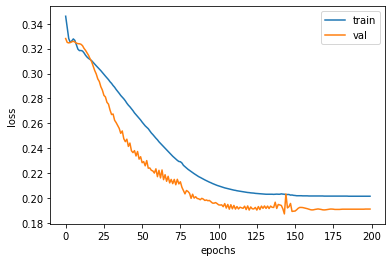

In [ ]:
plt.plot(train_losses, label = 'train')
plt.plot(val_losses, label = 'val')
plt.legend()
plt.xlabel('epochs')
plt.ylabel('loss')
plt.show()

In [ ]:
filename = 'MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/training_process.txt'
val_acc = [[] for i in range(4)]
with open(filename, 'r') as f:
  lines = f.readlines()
  for i,line in enumerate(lines):
    sample = line.split('\t')[-2]
    #print(sample)
    value = re.findall(pattern='(\d+.\d+)', string=sample)
    #print(value)
    if (i%6) == 2:
      #print(sample, '\n', value)
      val_acc[0].append(value[-1])
    elif (i%6) == 3:
      val_acc[1].append(value[-1])
    elif (i%6) == 4:
      val_acc[2].append(value[-1]) 
    elif (i%6) == 5:
      val_acc[3].append(value[-1])         

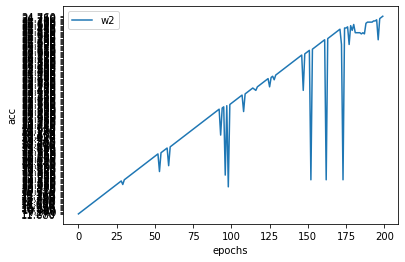

In [ ]:
#plt.plot(val_acc[0], label = 'w1')
plt.plot(val_acc[1], label = 'w2')
#plt.plot(val_acc[2], label = 'w3')
#plt.plot(val_acc[3], label = 'w4')

plt.legend()
plt.xlabel('epochs')
plt.ylabel('acc')
plt.show()

### INFERENCES

Plot probability distribution of softmax activation for 4 workers

In [ ]:
from networks.resnet import resnet16
import seaborn as sns
import torchvision
from torchvision import transforms
from networks.resnet_mixup import resnet16_chunk1, resnet16_chunk2

normalize = transforms.Normalize(mean=[x / 255 for x in [127.5, 127.5, 127.5]],
                                         std=[x / 255 for x in [127.5, 127.5, 127.5]])
transform_fn = transforms.Compose([
            transforms.ToTensor(),
            transforms.Resize((32,32)),
            transforms.Lambda(lambda x: x.repeat(3, 1, 1)),
            normalize,
            ])
fmnist = torchvision.datasets.FashionMNIST(root="/content/images/", download = True, train=True, transform = transform_fn)


Extracting /content/images/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw




Extracting /content/images/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw




Extracting /content/images/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/images/FashionMNIST/raw




Extracting /content/images/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/images/FashionMNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [ ]:
idx = []
idx1,idx2,idx3 = [],[],[]
for i in range(15000):
  if fmnist[i][1] == 0:
    idx1.append(i)
  if fmnist[i][1] == 1:
    idx2.append(i)
  if fmnist[i][1] == 2:
    idx3.append(i)

idx = idx1[:1000]+idx2[:1000]+idx3[:1000]

In [ ]:
test_batch = torch.utils.data.DataLoader(fmnist, batch_size=1, sampler=idx)
for tmp in test_batch:
  i+=1
  if i==4:
    break

tmp[1]

tensor([2])

In [ ]:
img=tmp[0]
target = tmp[1]

target_onehot = torch.FloatTensor(target.size(0), 10)
target_onehot.zero_()
target_onehot.scatter_(1, target.unsqueeze(1).data.cpu(), 1)

tensor([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]])

4 workers softmax activation

Initialise workers

In [ ]:

w1 = resnet16_chunk1(local_module_num=2, batch_size=128)
w2 = resnet16_chunk1(local_module_num=2, batch_size=128)
w3 = resnet16_chunk1(local_module_num=2, batch_size=128)
w4 = resnet16_chunk1(local_module_num=2, batch_size=128)
w = resnet16_chunk2(local_module_num=2, batch_size=128)

Load checkpoints

In [ ]:
w1c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/checkpoint_0/model_best.pth.tar', map_location = 'cpu')
w2c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/checkpoint_1/model_best.pth.tar', map_location = 'cpu')
w3c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/checkpoint_2/model_best.pth.tar', map_location = 'cpu')
w4c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/checkpoint_3/model_best.pth.tar', map_location = 'cpu')
wc = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_4/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_200_run2_chlr_2_wd/central_checkpoint/model_best.pth.tar', map_location = 'cpu')

Load weights

In [ ]:
w1.load_state_dict(w1c['state_dict'])
w2.load_state_dict(w2c['state_dict'])
w3.load_state_dict(w3c['state_dict'])
w4.load_state_dict(w4c['state_dict'])
w.load_state_dict(wc['state_dict'])

<All keys matched successfully>

In [ ]:
x1=w1(img)
x2=w2(img)
x3=w3(img)
x4=w4(img)

In [ ]:
target

tensor([2])

In [ ]:
logits1, loss1, z1 = w(x1, target_onehot)

In [ ]:
x=np.array([i for i in range(10)])
arr = logits1.detach().numpy()
df_dict={'x':x,
         'y_pred':arr.reshape(10),
         'y_true':target_onehot.reshape(10)}
df=pd.DataFrame(df_dict)
df

,x,y_pred,y_true
0,0,0.123872,0.0
1,1,0.083249,0.0
2,2,0.093297,1.0
3,3,0.079085,0.0
4,4,0.105542,0.0
5,5,0.108588,0.0
6,6,0.093727,0.0
7,7,0.100145,0.0
8,8,0.111465,0.0
9,9,0.101030,0.0


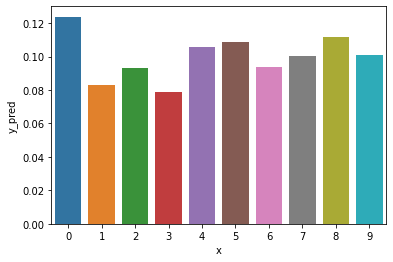

In [ ]:
sns.barplot(x='x', y='y_pred',data=df)

2 Workers softmax activation

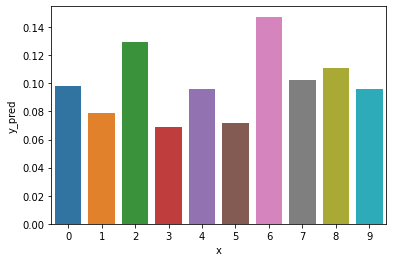

In [ ]:
w1 = resnet16_chunk1(local_module_num=2, batch_size=128)
w2 = resnet16_chunk1(local_module_num=2, batch_size=128)
w = resnet16_chunk2(local_module_num=2, batch_size=128)

w1c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_chlr_wd_exp/checkpoint_0/model_best.pth.tar', map_location = 'cpu')
w2c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_chlr_wd_exp/checkpoint_1/model_best.pth.tar', map_location = 'cpu')
wc = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_chlr_wd_exp/central_checkpoint/model_best.pth.tar', map_location = 'cpu')

w1.load_state_dict(w1c['state_dict'])
w2.load_state_dict(w2c['state_dict'])
w.load_state_dict(wc['state_dict'])

x1=w1(img)
x2=w2(img)

logits1, loss1, z1 = w(x1, target_onehot)

x=np.array([i for i in range(10)])
arr = logits1.detach().numpy()
df_dict={'x':x,
         'y_pred':arr.reshape(10),
         'y_true':target_onehot.reshape(10)}
df=pd.DataFrame(df_dict)

sns.barplot(x='x', y='y_pred',data=df)

2 workers sigmoid activation

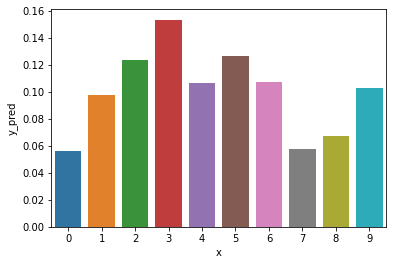

In [ ]:
w1 = resnet16_chunk1(local_module_num=2, batch_size=128)
w2 = resnet16_chunk1(local_module_num=2, batch_size=128)
w = resnet16_chunk2(local_module_num=2, batch_size=128)

w1c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_sigmoid/checkpoint_0/model_best.pth.tar', map_location = 'cpu')
w2c = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_sigmoid/checkpoint_1/model_best.pth.tar', map_location = 'cpu')
wc = torch.load('/content/gdrive/Shareddrives/Disk1/InfoPro-Pytorch/Experiments on CIFAR-SVHN-STL10/MixUp_fmnist_resnet16_K_2_/multiworker/week8/worker_2/alpha_0.0_beta_1_0.0_beta_2_0.0_gamma_1_0.0_gamma_2_0.0_epochs_150_run2_sigmoid/central_checkpoint/model_best.pth.tar', map_location = 'cpu')

w1.load_state_dict(w1c['state_dict'])
w2.load_state_dict(w2c['state_dict'])
w.load_state_dict(wc['state_dict'])

x1=w1(img)
x2=w2(img)

logits1, loss1, z1 = w(x1, target_onehot)

x=np.array([i for i in range(10)])
arr = logits1.detach().numpy()
df_dict={'x':x,
         'y_pred':arr.reshape(10),
         'y_true':target_onehot.reshape(10)}
df=pd.DataFrame(df_dict)

sns.barplot(x='x', y='y_pred',data=df)